In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2017



In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.44,-2.17,-2.30,-1.41,-0.80,-0.58,-1.09,-0.99,-0.88,-0.86,-0.73,-1.12
1,1.0,-1.52,-2.10,-2.21,-1.52,-1.01,-0.75,-1.17,-1.07,-0.97,-1.00,-0.93,-1.17
2,1.5,-1.59,-2.04,-2.14,-1.61,-1.18,-0.89,-1.21,-1.12,-1.01,-1.10,-1.07,-1.19
3,2.0,-1.64,-1.99,-2.07,-1.68,-1.31,-0.96,-1.20,-1.11,-1.00,-1.14,-1.13,-1.15
4,2.5,-1.66,-1.94,-2.01,-1.72,-1.38,-0.98,-1.14,-1.05,-0.94,-1.11,-1.12,-1.06


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000
mean,50.250000,0.507300,0.570900,0.603750,0.492200,0.738350,1.204450,1.316650,1.415950,1.480450,1.367200,1.490000,1.56695
std,28.939592,0.678407,0.759234,0.797821,0.708025,0.663178,0.618356,0.647964,0.651546,0.632845,0.668257,0.688413,0.67273
min,0.500000,-1.660000,-2.170000,-2.300000,-1.730000,-1.400000,-0.980000,-1.210000,-1.120000,-1.010000,-1.140000,-1.130000,-1.19000
25%,25.375000,0.467500,0.565000,0.587500,0.437500,0.685000,1.200000,1.340000,1.427500,1.497500,1.367500,1.507500,1.61000
50%,50.250000,0.800000,0.890000,0.940000,0.800000,1.025000,1.460000,1.575000,1.680000,1.735000,1.645000,1.770000,1.83000
75%,75.125000,0.910000,1.000000,1.060000,0.920000,1.140000,1.560000,1.660000,1.762500,1.810000,1.730000,1.860000,1.90000
max,100.000000,0.970000,1.060000,1.120000,0.980000,1.200000,1.610000,1.700000,1.810000,1.850000,1.780000,1.900000,1.94000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,15.299648,16.548543,17.501294,16.157136,15.164410,13.460113,13.403505,13.600239,13.043053,14.181935,14.327940,13.349460
Jan,15.299648,0.460236,0.513009,0.539217,0.480121,0.449219,0.418199,0.432056,0.435047,0.421384,0.449167,0.461468,0.443184
Feb,16.548543,0.513009,0.576436,0.605687,0.533858,0.498365,0.468388,0.488985,0.491989,0.477097,0.505803,0.520066,0.503973
Mar,17.501294,0.539217,0.605687,0.636519,0.561229,0.523869,0.491971,0.513442,0.516678,0.500973,0.531248,0.546053,0.529017
Apr,16.157136,0.480121,0.533858,0.561229,0.501300,0.469290,0.435470,0.448367,0.451593,0.437209,0.466851,0.479418,0.459125
May,15.164410,0.449219,0.498365,0.523869,0.469290,0.439805,0.407375,0.418300,0.421347,0.407853,0.436094,0.447950,0.427882
June,13.460113,0.418199,0.468388,0.491971,0.435470,0.407375,0.382365,0.397688,0.400072,0.387935,0.411949,0.424010,0.409397
July,13.403505,0.432056,0.488985,0.513442,0.448367,0.418300,0.397688,0.419858,0.422109,0.409991,0.432247,0.445355,0.435142
Aug,13.600239,0.435047,0.491989,0.516678,0.451593,0.421347,0.400072,0.422109,0.424512,0.412260,0.434863,0.447904,0.437329
Sept,13.043053,0.421384,0.477097,0.500973,0.437209,0.407853,0.387935,0.409991,0.412260,0.400493,0.422108,0.434928,0.425179


In [5]:
df.var()

Matuarity    837.500000
Jan            0.460236
Feb            0.576436
Mar            0.636519
Apr            0.501300
May            0.439805
June           0.382365
July           0.419858
Aug            0.424512
Sept           0.400493
Oct            0.446568
Nov            0.473913
Dec            0.452565
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.44,-2.17,-2.30,-1.41,-0.80,-0.58,-1.09,-0.99,-0.88,-0.86,-0.73,-1.12
1,1.0,-1.52,-2.10,-2.21,-1.52,-1.01,-0.75,-1.17,-1.07,-0.97,-1.00,-0.93,-1.17
2,1.5,-1.59,-2.04,-2.14,-1.61,-1.18,-0.89,-1.21,-1.12,-1.01,-1.10,-1.07,-1.19
3,2.0,-1.64,-1.99,-2.07,-1.68,-1.31,-0.96,-1.20,-1.11,-1.00,-1.14,-1.13,-1.15
4,2.5,-1.66,-1.94,-2.01,-1.72,-1.38,-0.98,-1.14,-1.05,-0.94,-1.11,-1.12,-1.06


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

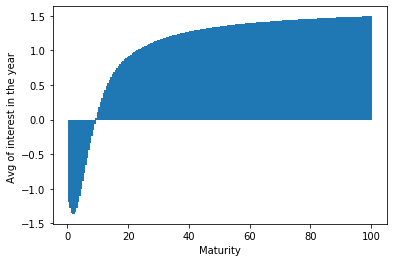

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 12 weeks

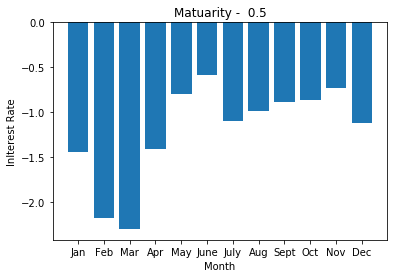

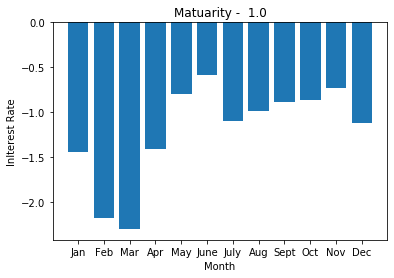

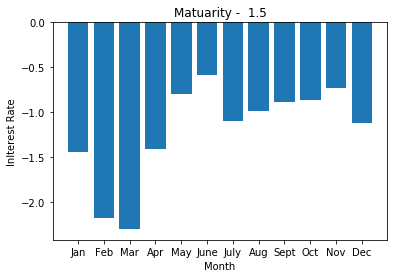

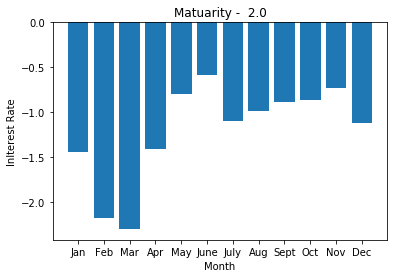

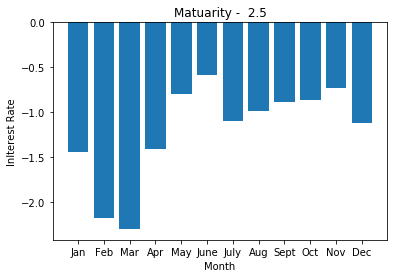

...

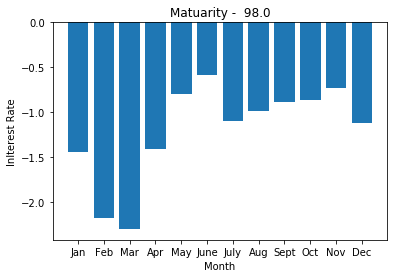

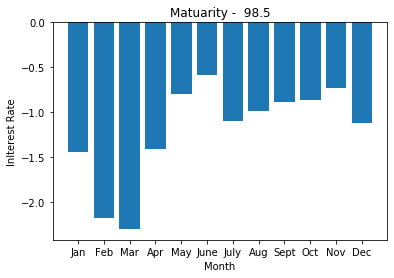

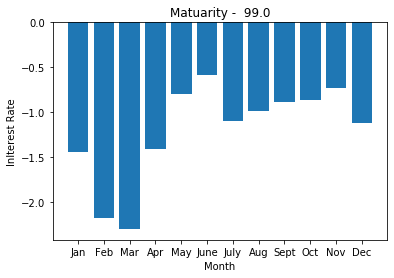

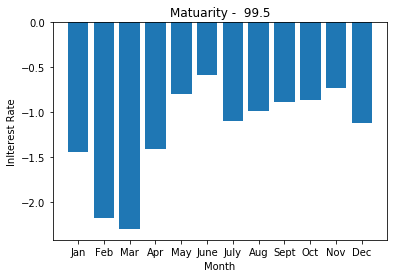

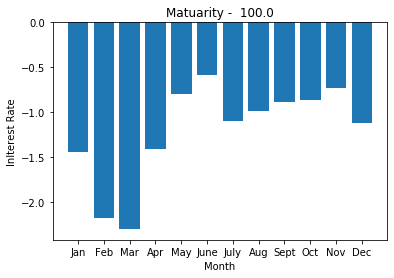

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

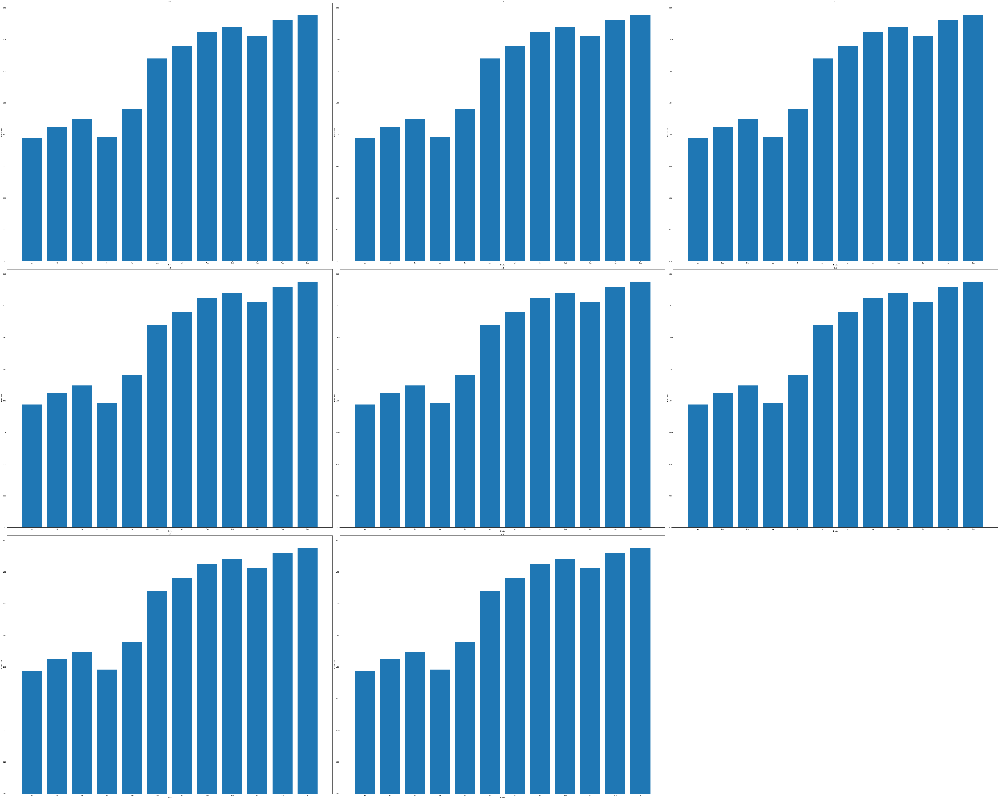

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

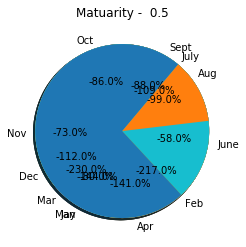

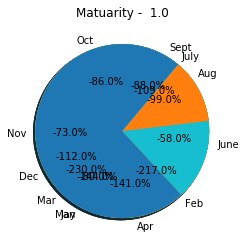

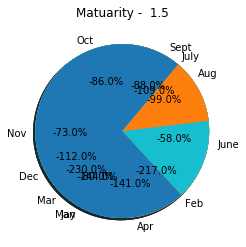

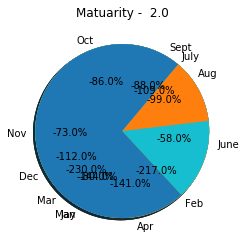

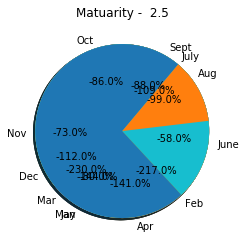

...

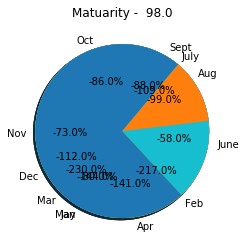

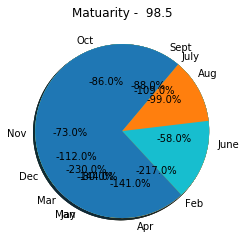

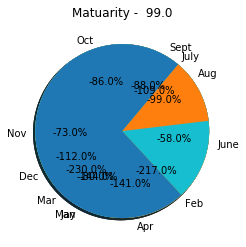

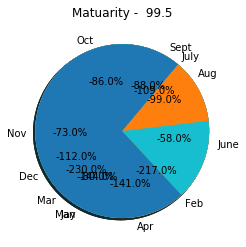

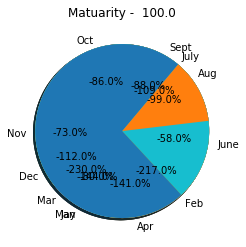

In [18]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    theme = plt.get_cmap('copper')
    plt.show()
   

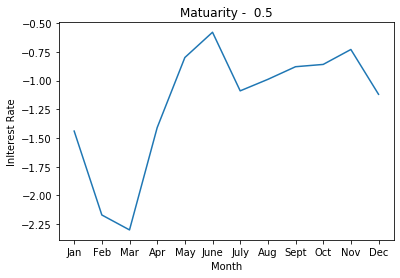

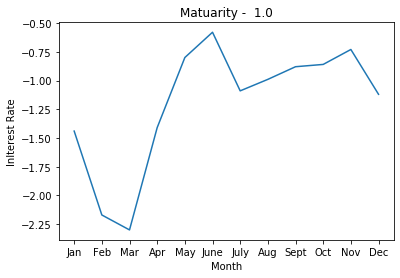

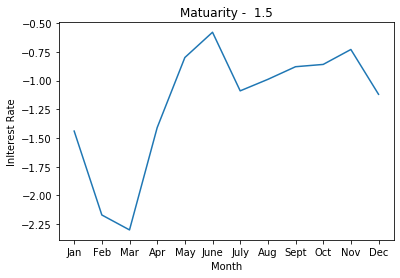

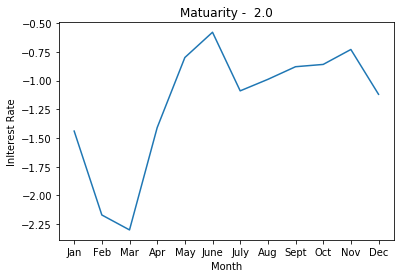

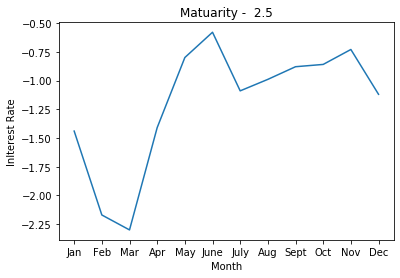

...

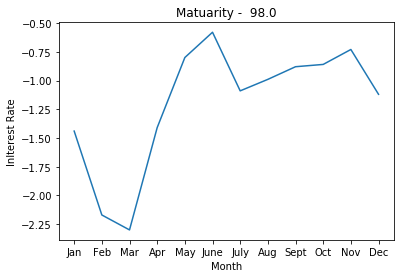

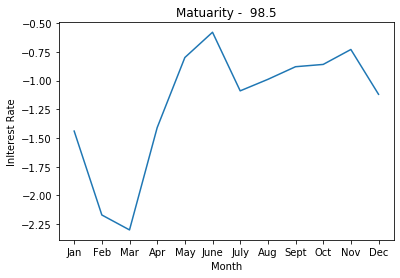

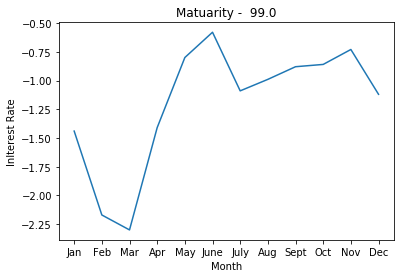

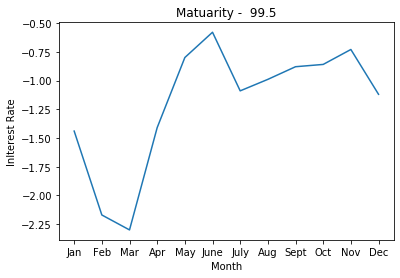

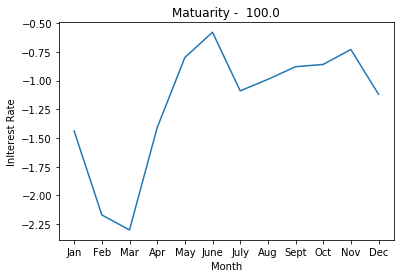

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

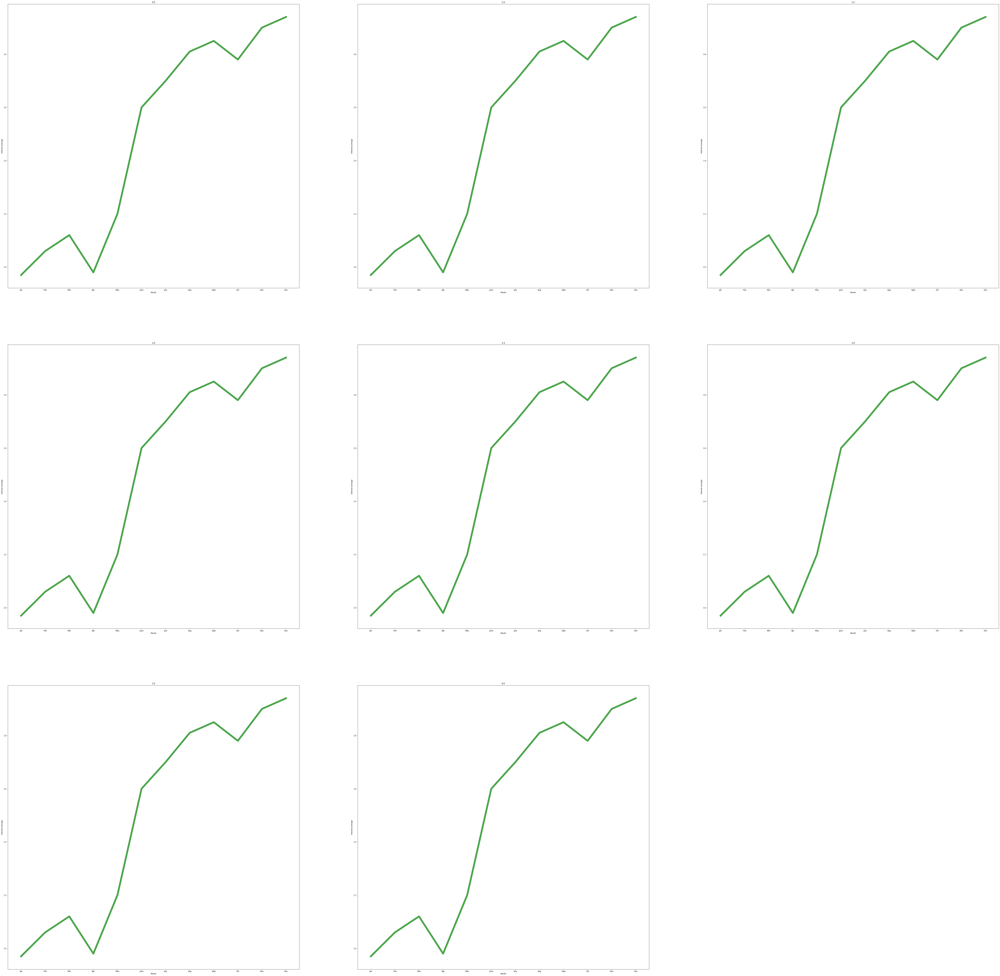

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [16]:
df['sum'].sum()/200

1.0628458333333333